## 00 Load Required Libraries and Functions

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.transform import Rotation as R
from numpy.random import default_rng
from pathlib import Path
import sys
import os
sys.path.append(os.path.abspath('..'))

In [2]:
from functions import finding_defects as df
from functions import finetuning_training as utils

## 01 Load models

In [3]:
defect_finder_model = utils.load_model("../data/models/defect_finder300.tar")
lattice_finder_model = utils.load_model("../data/models/ensemble_lattice_finder_48160.pt")

## 02 Load Images and Select Best

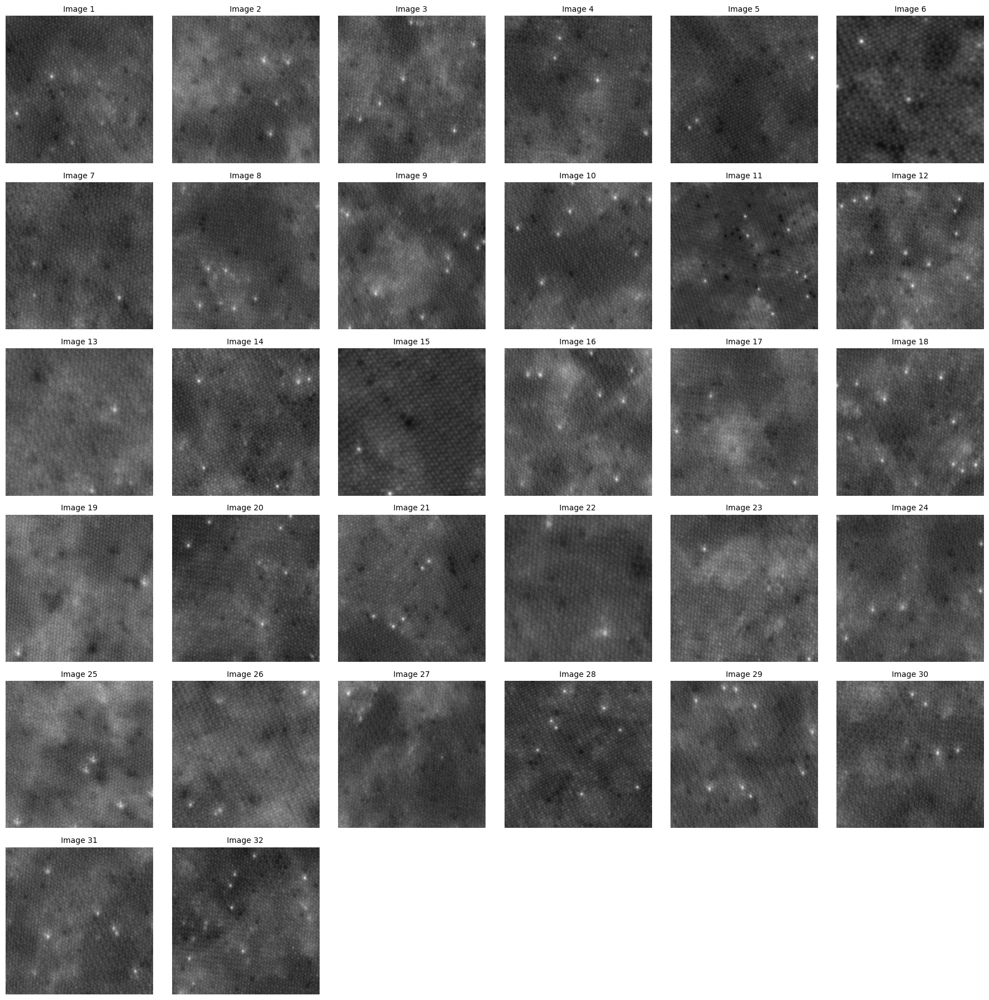

In [4]:
folder_path = "../data/images/9_1HF"
images,file_names = df.load_tif_folder(folder_path)        
df.plot_grid(images)


Batch 1/1

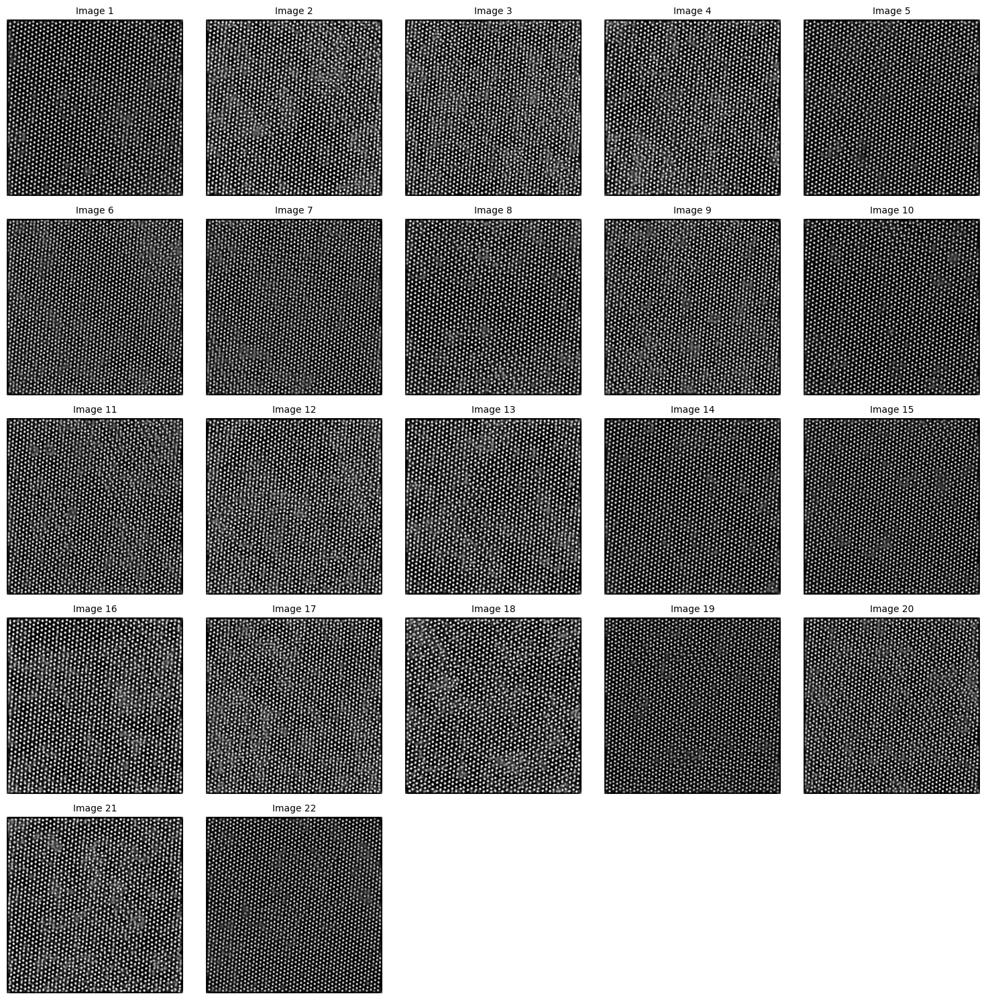

In [ ]:
mask_from_ensemble = lambda im: utils.get_total_points_ensemble(lattice_finder_model, im, plot2=False, normalize=True, t_values=[.5])[1]
remove_9_HF = [5, 6, 10, 12, 14, 18, 21, 24, 26, 29]
images_new = [img for i, img in enumerate(images) if i not in remove_9_HF]
df.plot_grid(images_new, show_mask=True, mask_func=mask_from_ensemble)

Batch 1/1
1 image was decoded in approximately 0.1196 seconds
Batch 1/1
1 image was decoded in approximately 0.1235 seconds
Batch 1/1
1 image was decoded in approximately 0.1372 seconds
Batch 1/1
1 image was decoded in approximately 0.1179 seconds
Batch 1/1
1 image was decoded in approximately 0.1164 seconds
Batch 1/1
1 image was decoded in approximately 0.1114 seconds
Batch 1/1
1 image was decoded in approximately 0.115 seconds
Batch 1/1
1 image was decoded in approximately 0.1237 seconds
Batch 1/1
1 image was decoded in approximately 0.1144 seconds
Batch 1/1
1 image was decoded in approximately 0.1144 seconds
Batch 1/1
1 image was decoded in approximately 0.1155 seconds
Batch 1/1
1 image was decoded in approximately 0.1231 seconds
Batch 1/1
1 image was decoded in approximately 0.1175 seconds
Batch 1/1
1 image was decoded in approximately 0.1245 seconds
Batch 1/1
1 image was decoded in approximately 0.1149 seconds
Batch 1/1
1 image was decoded in approximately 0.1139 seconds
Batch 1/1

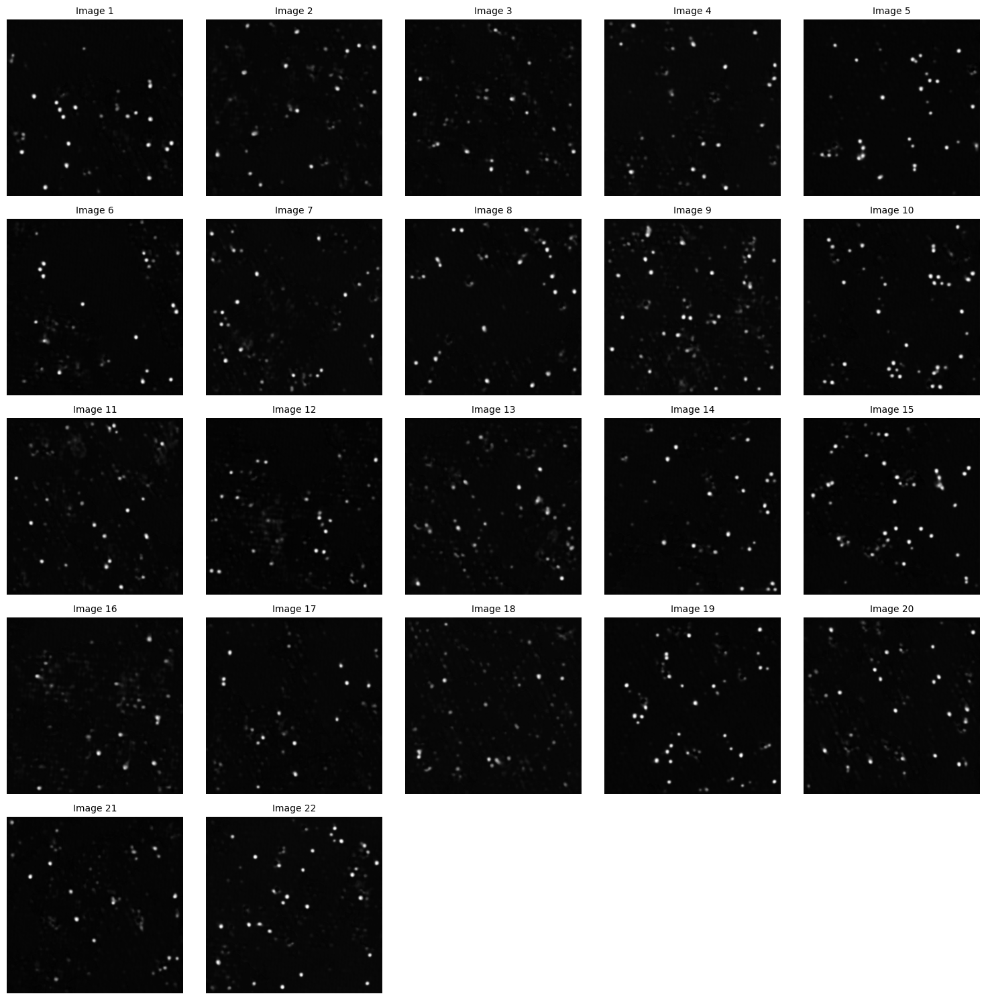

In [7]:
df.plot_grid(images_new, show_mask=True, model = defect_finder_model, thresh=False)

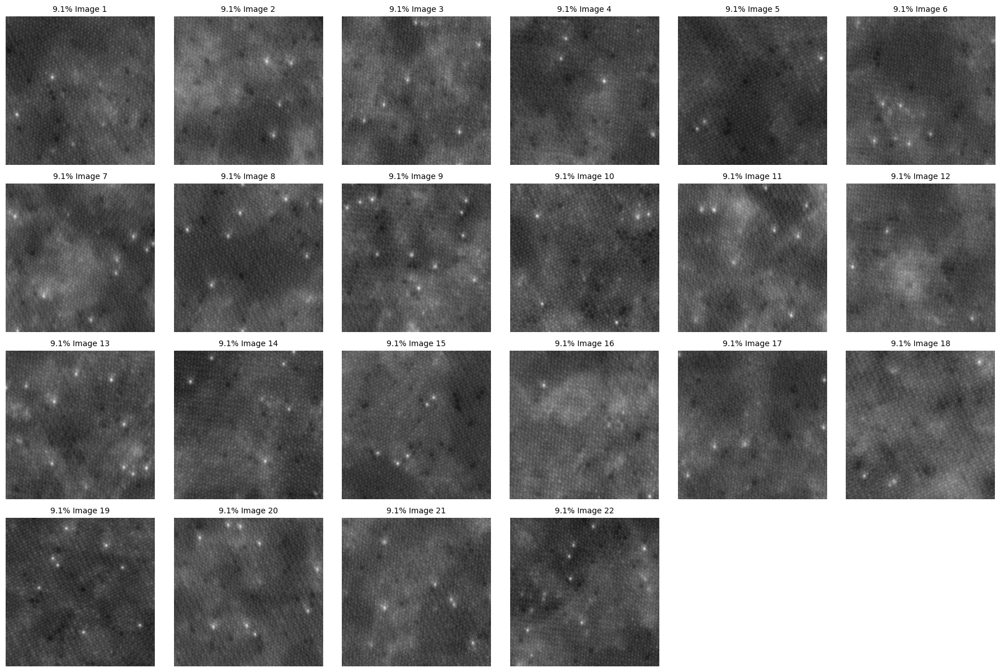

In [8]:
df.plot_grid(images_new, cols = 6, title_prefix= "9.1% Image")

Batch 1/1
1 image was decoded in approximately 0.1354 seconds
Batch 1/1
1 image was decoded in approximately 0.1194 seconds
Batch 1/1
1 image was decoded in approximately 0.1161 seconds
Batch 1/1
1 image was decoded in approximately 0.1137 seconds
Batch 1/1
1 image was decoded in approximately 0.1181 seconds
Batch 1/1
1 image was decoded in approximately 0.1199 seconds
Batch 1/1
1 image was decoded in approximately 0.1139 seconds
Batch 1/1
1 image was decoded in approximately 0.1304 seconds
Batch 1/1
1 image was decoded in approximately 0.1188 seconds
Batch 1/1
1 image was decoded in approximately 0.1172 seconds
Batch 1/1
1 image was decoded in approximately 0.118 seconds
Batch 1/1
1 image was decoded in approximately 0.119 seconds
Batch 1/1
1 image was decoded in approximately 0.1252 seconds
Batch 1/1
1 image was decoded in approximately 0.1174 seconds
Batch 1/1
1 image was decoded in approximately 0.1255 seconds
Batch 1/1
1 image was decoded in approximately 0.121 seconds
Batch 1/1
1

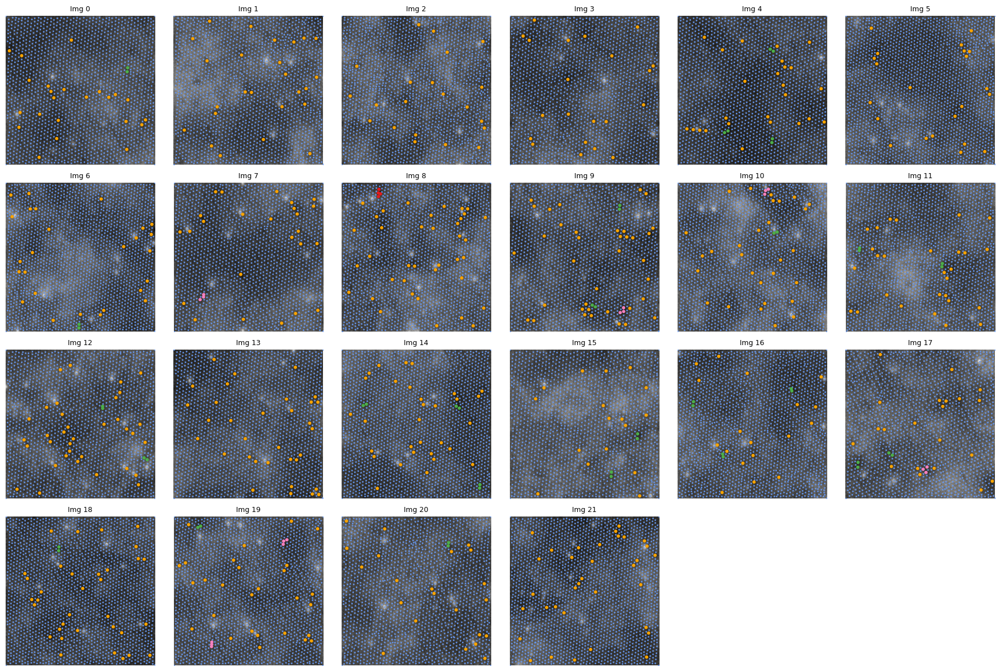

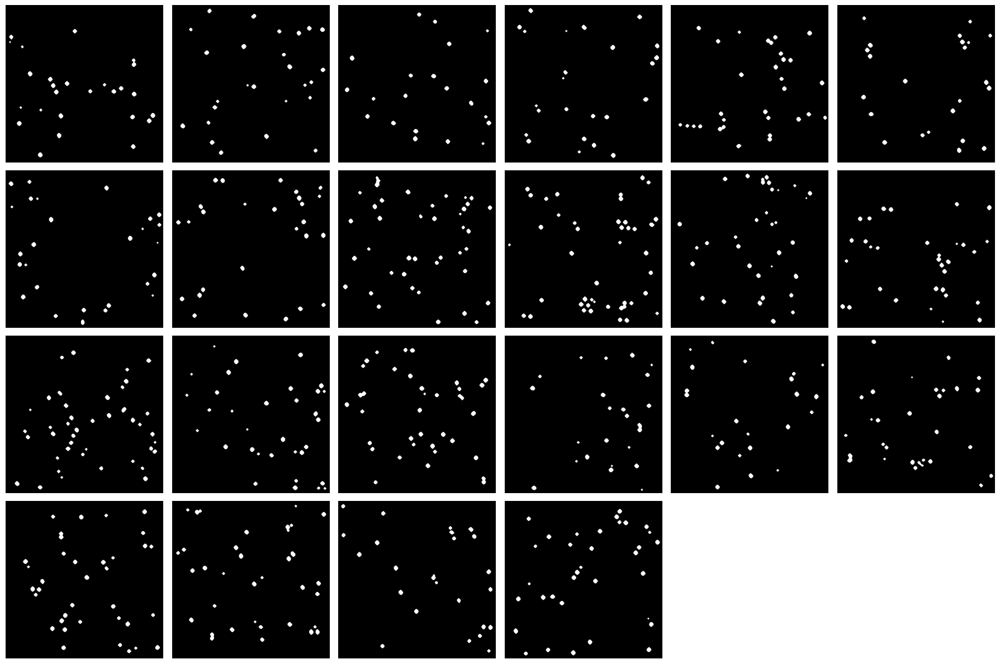

In [10]:
img_stats = df.plot_point_masks_grid(images_new, ensemble_pred= lattice_finder_model, defect_model=defect_finder_model, plot_mask_grid= True, low_thresh= .5, rows = 4)

## 04 Statistics

In [12]:
colors = np.concatenate([stat['colors'] for stat in img_stats], axis=0)
total_vac = len(colors)
print("Total vacancies:", total_vac)

Total vacancies: 665


In [13]:
total_points = sum(len(stat['regular_points']) for stat in img_stats)
print("Total regular points:", total_points)


Total regular points: 43301


In [14]:
percent = round(100 * total_vac/(total_vac+total_points), 2)
print("Percentage of vacancies:", percent, "%")

Percentage of vacancies: 1.51 %


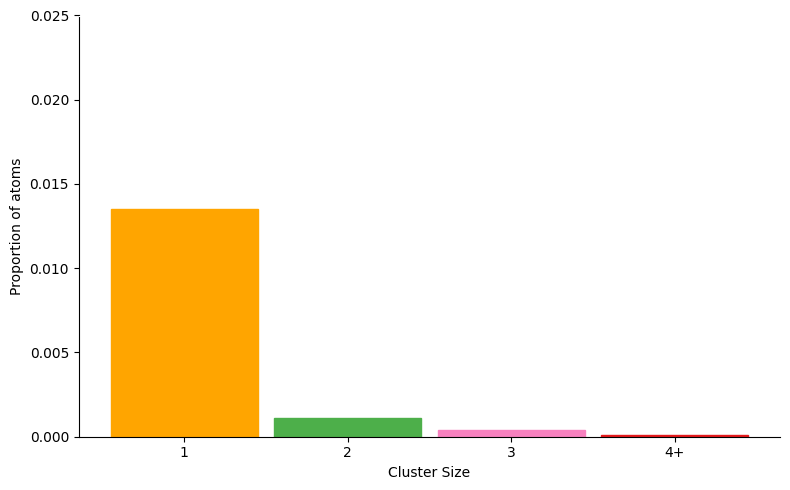

In [17]:
fig, ax2 = plt.subplots(figsize=(8, 5))
#ax2.set_facecolor('none')  # Make axes background transparent

color_order = ['orange', '#4daf4a', '#f781bf', '#e41a1c']
fractions = [(colors == col).sum() / (total_points + total_vac) for col in color_order]


for i, (col, frac) in enumerate(zip(color_order, fractions), 1):
    ax2.bar(i, frac, color=col, edgecolor=col, width=0.9)


ax2.set_xticks(range(1, 5))

ax2.set_xticklabels(['1', '2', '3', '4+'], c="black")
ax2.set_xlabel("Cluster Size", fontsize=10, c="black")
ax2.set_ylabel("Proportion of atoms", fontsize=10, c="black")
ax2.tick_params(colors='black')
ax2.spines['top'].set_color('white')
ax2.spines['right'].set_color('white')
ax2.set_ylim(0, 0.025)
#plt.title("9.1% HF", fontsize=16, c="black")
plt.tight_layout()
plt.show()



   size      mean        se  ci_lower  ci_upper    rel_se  ci_minus   ci_plus
0     1  1.456838  0.416705  0.349825  2.306080  4.938111  1.107013  0.849241
1     5  1.460883  0.180589  1.084128  1.809313  2.140052  0.376755  0.348429
2    10  1.461538  0.128167  1.202984  1.710389  1.518828  0.258554  0.248852
3    15  1.461966  0.105980  1.249944  1.666424  1.255905  0.212022  0.204459
4    20  1.462389  0.091591  1.277146  1.637439  1.085391  0.185243  0.175050
6    23  1.460432  0.084385  1.292215  1.620982  1.000000  0.168217  0.160550
5    25  1.462079  0.081898  1.300612  1.620766  0.970525  0.161467  0.158687


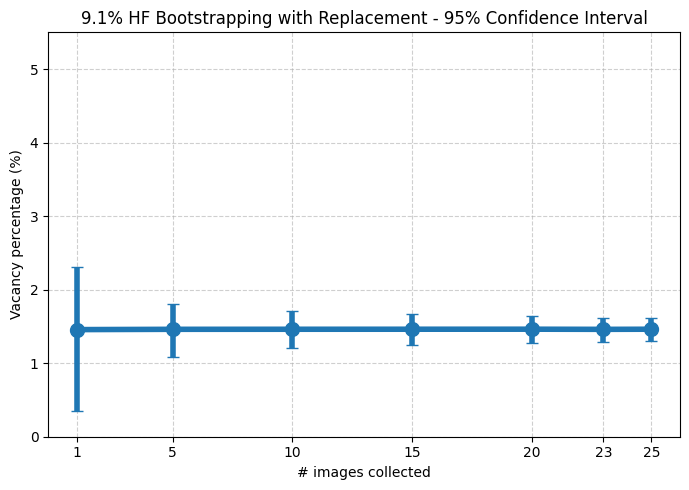

In [15]:
def vacancy_percent(sample):
    """Vacancy % for a list of image dictionaries."""
    vac = sum(len(s['defect_points'])  for s in sample)
    reg = sum(len(s['regular_points']) for s in sample)
    return 100 * vac / (vac + reg)

sample_sizes = [1, 5, 10, 15, 20, 25, len(img_stats)]
B = 4000
rng = default_rng(42)

records = []
N_imgs = len(img_stats)

for n in sample_sizes:
    boots = []
    for _ in range(B):
        idx = rng.choice(N_imgs, size=n, replace=True)
        boots.append(vacancy_percent([img_stats[i] for i in idx]))
    boots = np.asarray(boots)
    records.append({
        'size'     : n,
        'mean'     : boots.mean(),
        'se'       : boots.std(ddof=1),
        'ci_lower' : np.percentile(boots, 2.5),
        'ci_upper' : np.percentile(boots, 97.5),
    })


results = pd.DataFrame(records).sort_values('size')
se_full             = results.loc[results['size'] == len(img_stats), 'se'].iloc[0]
results['rel_se']   = results['se'] / se_full

# optional: split CI into asym‑error for plotting
results['ci_minus'] = results['mean'] - results['ci_lower']
results['ci_plus']  = results['ci_upper'] - results['mean']

print(results)
# --------------------------------------------------------------------
# Plot with 95 % confidence intervals
# --------------------------------------------------------------------
plt.figure(figsize=(7, 5))
plt.errorbar(
    results['size'],
    results['mean'],
    yerr=[results['ci_minus'], results['ci_plus']],
    fmt='o-',
    capsize=4,
    linewidth=4,
    markersize=10
)
plt.xticks(sample_sizes)
plt.xlabel('# images collected')
plt.ylim(0, 5.5)  

plt.ylabel('Vacancy percentage (%)')
plt.title('9.1% HF Bootstrapping with Replacement - 95% Confidence Interval')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

## 05 Save Everything

In [16]:
folder      = Path("../images/9_1HF")
remove_idx  = set(remove_9_HF)          # indices to skip
resize_px   = 512
ps_by_mx = {
    8.70 : 0.011202,   # 8.70 Mx  → 0.011202 nm / pixel
    10.00: 0.007921,   # 10.0 Mx  → 0.007921 nm / pixel
    12.50: 0.007921,   # 12.5 Mx  → 0.007921 nm / pixel
    14.50: 0.005601,   # 14.5 Mx  → 0.005601 nm / pixel
    17.50: 0.005601,   # 17.5 Mx  → 0.005601 nm / pixel
}


imgs, px_orig, px_new = df.load_images_with_pixel_sizes(folder, ps_by_mx,
                                                     resize_px, remove_idx)


In [17]:
for s, img_arr, fname, px in zip(img_stats, images_new, file_names, px_new):
    s["image"] = img_arr
    s["pixel_size_nm"] = px
    s["file_name"] = fname

In [18]:
list(img_stats[0].keys())

['image_index',
 'regular_points',
 'defect_points',
 'colors',
 'cluster_counts',
 'mask',
 'image',
 'pixel_size_nm',
 'file_name']

In [ ]:
import pickle
from datetime import date

data_to_save = {
    "img_stats": img_stats,
    "total_vac": total_vac,
    "total_points": total_points,
    "percent_vacancies": percent,
}


fname = f"../data/stats/9_1_percent_stats_{date.today():%Y%m%d}.pkl"
with open(fname, "wb") as f:
    pickle.dump(data_to_save, f)